<a href="https://colab.research.google.com/github/dkbean/Improved-stability-of-WGAN-GP/blob/main/1.%20WGAN%20Anime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip uninstall tensorflow -y


In [ ]:
!pip install  tensorflow==2.8.0

In [ ]:
!unzip /content/drive/MyDrive/anime.zip -d ./datasets

In [ ]:
! pwd


/content


In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [ ]:
print(tf.version.VERSION)

2.8.0


In [ ]:
anime_data_dir = "/content/datasets/images"

In [ ]:
train_images = tf.keras.utils.image_dataset_from_directory(
    anime_data_dir, label_mode=None, image_size=(64, 64), batch_size=256 # update from 32
)

Found 63565 files belonging to 1 classes.


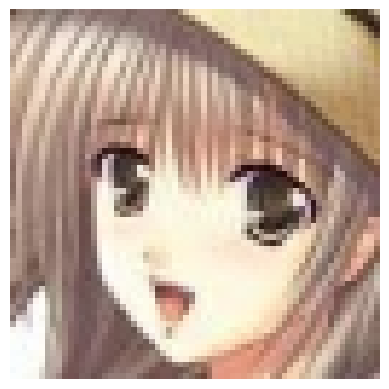

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i])
        plt.imshow(img)
        plt.axis('off')
    plt.show()

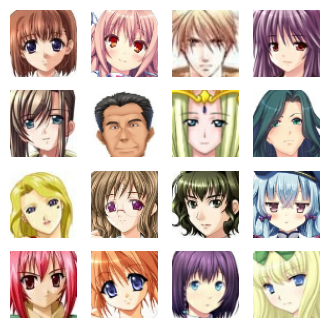

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

### Preprocessing

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

## The Generator

Define the generator model architecture with the Keras `Sequential` API.

Use `ReLU` except for the last layer which has `tanh` as the activation.

The job of the generator is to make images: we feed random noise as input to the generator and upsample it till the desired image size becomes 64x64x3.

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 100

WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3

In [ ]:
def build_generator():
    # create a Keras Sequential model
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator()

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             4227072   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 256)      2097152   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 256)      1024      
 ormalization)                                                   
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0 

## The Critic
In WGAN we have a critic instead of a discriminator.
If you are updating a DCGAN to a WGAN, you can use the “Find and replace” in Colab for the updates.


In [ ]:
# UPDATE for WGAN: a new class implementing weight clipping constraint
class WeightClipping(tf.keras.constraints.Constraint):
    def __init__(self, clip_value):
        self.clip_value = clip_value

    def __call__(self, weights):
        return tf.clip_by_value(weights, -self.clip_value, self.clip_value)

    def get_config(self):
        return {'clip_value': self.clip_value}

Define the Critic model architecture with the Keras `Sequential` API

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    #UPDATE for WGAN: enfoce 1-Lipschitz constraint with weight clippping to [-1, 1]
    constraint = WeightClipping(0.01)

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), padding="same",
                            strides=(2, 2),
                            kernel_constraint = constraint, # UPDATE for WGAN
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same",
                            strides=(2, 2),
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same",
                            strides=(2, 2),
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # UPDATE for WGAN: linear activation in the last layer.
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3)

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)              0    

## WGAN

Subclass `keras.Model` to implement WGAN and override `train_step()` to implement custom training steps for training the critic and generator in WGAN.

In [ ]:
class WGAN(keras.Model):
    def __init__(self,
                 critic,
                 generator,
                 latent_dim,
                 critic_extra_steps): # UPDATE
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN: remove the code of real / fake labels
    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # UPDATE for WGAN: we train the critic more often than the generator by 5 times (self.c_extra_steps)
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images
            with tf.GradientTape() as tape:
                # Get the critic' predictions on the real images
                pred_real = self.critic(real_images, training=True)
                # Generate fake images from the latent noise
                fake_images = self.generator(noise, training=True)
                # Get the critic' predictions on the fake images
                pred_fake = self.critic(fake_images, training=True)
                # Calculate the critic loss with wassertein loss function
                d_loss = self.d_loss_fn(pred_real, pred_fake)
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator weights
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

## Use Keras Callback to monitor training

The nice thing about overriding `train_step()` of `keras.Model()` is that we can subclass `Callback` to monitor our DCGAN training.

I use the seed noise to create images (with the generator model) throughout the training to see the progress of the generator is making. Also saved the generator model at the end of the training which could potentially be used for inference later.

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

## Compile and Train WGAN

Compile the `wgan` model with the `RMSprop` optimizer (a learning rate of 0.00005) as recommended by the paper, and the **Wasserstein loss**

### Putting together the `wgan` model

In [ ]:
wgan = WGAN(critic=critic,
              generator=generator,
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) # UPDATE for WGAN

### Wasserstein loss

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

### Compile WGAN

In [ ]:
LR = 0.00005 # UPDATE for WGAN: learning rate per WGAN paper, might change to 0.0002

In [ ]:
wgan.compile(
    d_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    g_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

### Train WGAN

Now we simply call `model.fit()` to train the `wgan` model!

Epoch 1/50
249/249 [==============================] - ETA: 0s - d_loss: -74.6972 - g_loss: -49.1315

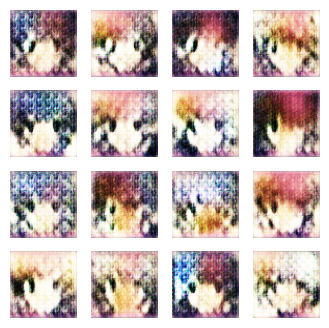

249/249 [==============================] - 85s 342ms/step - d_loss: -74.6972 - g_loss: -49.1315
Epoch 2/50
249/249 [==============================] - ETA: 0s - d_loss: -94.2988 - g_loss: -53.4720

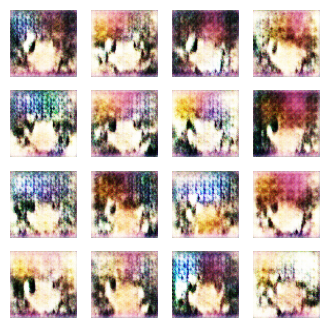

249/249 [==============================] - 86s 343ms/step - d_loss: -94.2988 - g_loss: -53.4720
Epoch 3/50
249/249 [==============================] - ETA: 0s - d_loss: -103.9859 - g_loss: -124.9292

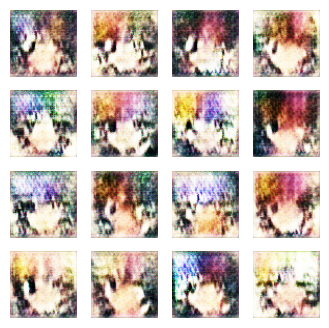

249/249 [==============================] - 86s 343ms/step - d_loss: -103.9859 - g_loss: -124.9292
Epoch 4/50
249/249 [==============================] - ETA: 0s - d_loss: -118.8357 - g_loss: -163.7242

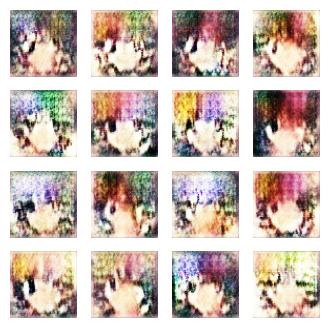

249/249 [==============================] - 85s 341ms/step - d_loss: -118.8357 - g_loss: -163.7242
Epoch 5/50
249/249 [==============================] - ETA: 0s - d_loss: -124.4968 - g_loss: -239.3115

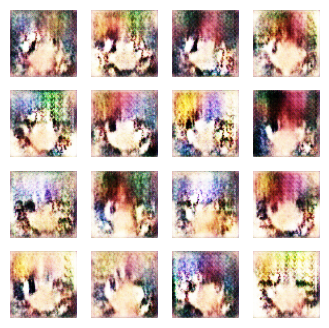

249/249 [==============================] - 86s 343ms/step - d_loss: -124.4968 - g_loss: -239.3115
Epoch 6/50
249/249 [==============================] - ETA: 0s - d_loss: -126.8292 - g_loss: -239.2522

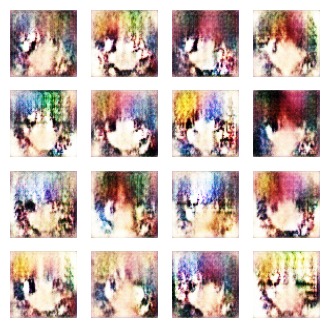

249/249 [==============================] - 86s 343ms/step - d_loss: -126.8292 - g_loss: -239.2522
Epoch 7/50
249/249 [==============================] - ETA: 0s - d_loss: -128.6322 - g_loss: -404.3170

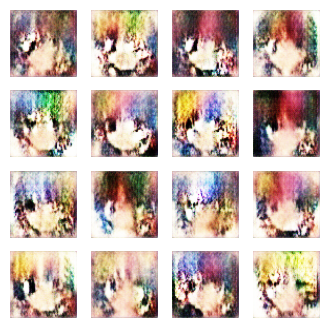

249/249 [==============================] - 86s 342ms/step - d_loss: -128.6322 - g_loss: -404.3170
Epoch 8/50
249/249 [==============================] - ETA: 0s - d_loss: -129.2617 - g_loss: -298.1595

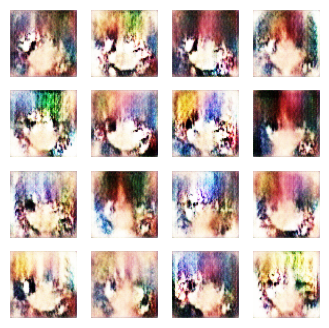

249/249 [==============================] - 86s 342ms/step - d_loss: -129.2617 - g_loss: -298.1595
Epoch 9/50
249/249 [==============================] - ETA: 0s - d_loss: -128.0788 - g_loss: -414.8060

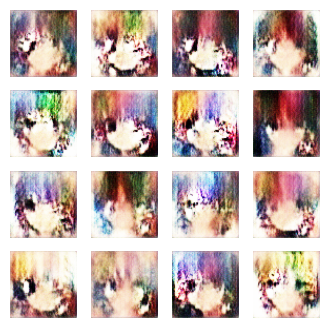

249/249 [==============================] - 86s 343ms/step - d_loss: -128.0788 - g_loss: -414.8060
Epoch 10/50
249/249 [==============================] - ETA: 0s - d_loss: -125.1429 - g_loss: -282.0087

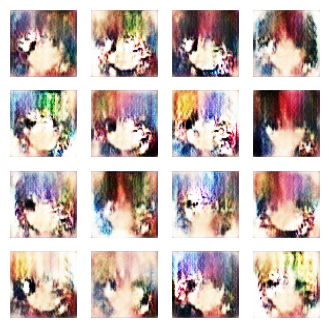

249/249 [==============================] - 85s 342ms/step - d_loss: -125.1429 - g_loss: -282.0087
Epoch 11/50
249/249 [==============================] - ETA: 0s - d_loss: -123.5925 - g_loss: -487.0101

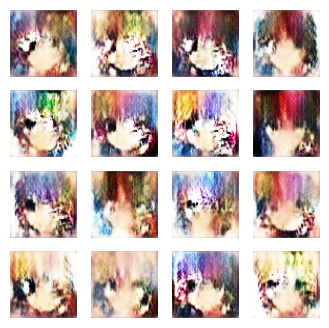

249/249 [==============================] - 86s 342ms/step - d_loss: -123.5925 - g_loss: -487.0101
Epoch 12/50
249/249 [==============================] - ETA: 0s - d_loss: -123.8534 - g_loss: -460.6686

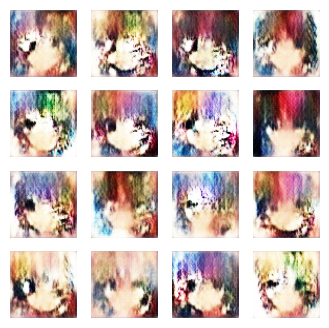

249/249 [==============================] - 85s 342ms/step - d_loss: -123.8534 - g_loss: -460.6686
Epoch 13/50
249/249 [==============================] - ETA: 0s - d_loss: -120.1267 - g_loss: -397.1996

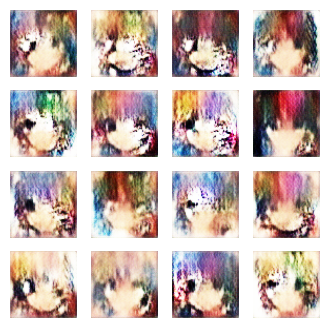

249/249 [==============================] - 86s 343ms/step - d_loss: -120.1267 - g_loss: -397.1996
Epoch 14/50
249/249 [==============================] - ETA: 0s - d_loss: -119.4718 - g_loss: -530.7275

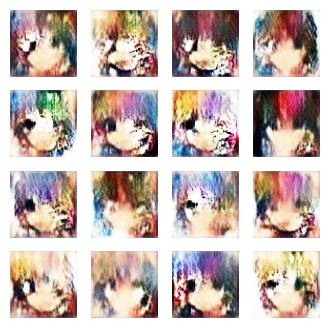

249/249 [==============================] - 86s 342ms/step - d_loss: -119.4718 - g_loss: -530.7275
Epoch 15/50
249/249 [==============================] - ETA: 0s - d_loss: -121.1819 - g_loss: -650.7739

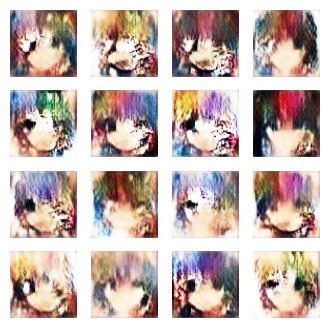

249/249 [==============================] - 86s 342ms/step - d_loss: -121.1819 - g_loss: -650.7739
Epoch 16/50
249/249 [==============================] - ETA: 0s - d_loss: -120.5687 - g_loss: -689.2593

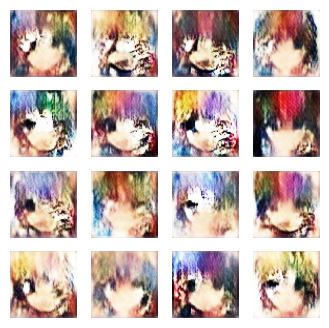

249/249 [==============================] - 85s 342ms/step - d_loss: -120.5687 - g_loss: -689.2593
Epoch 17/50
249/249 [==============================] - ETA: 0s - d_loss: -121.8416 - g_loss: -459.3426

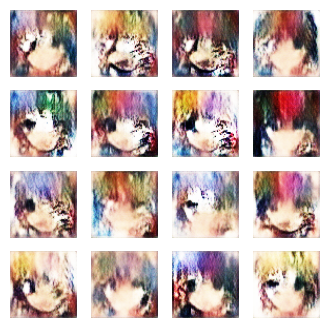

249/249 [==============================] - 86s 343ms/step - d_loss: -121.8416 - g_loss: -459.3426
Epoch 18/50
249/249 [==============================] - ETA: 0s - d_loss: -117.6271 - g_loss: -324.8358

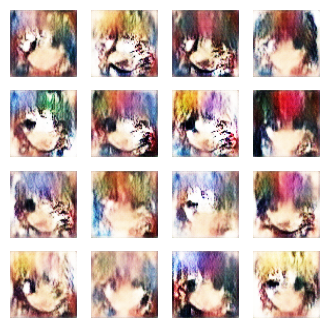

249/249 [==============================] - 86s 342ms/step - d_loss: -117.6271 - g_loss: -324.8358
Epoch 19/50
249/249 [==============================] - ETA: 0s - d_loss: -119.3491 - g_loss: -882.1935

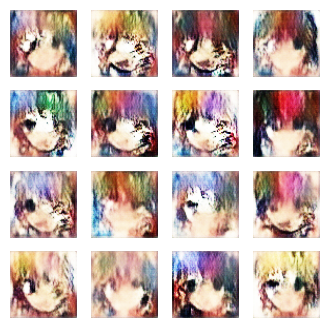

249/249 [==============================] - 85s 342ms/step - d_loss: -119.3491 - g_loss: -882.1935
Epoch 20/50
249/249 [==============================] - ETA: 0s - d_loss: -119.0839 - g_loss: -878.8425

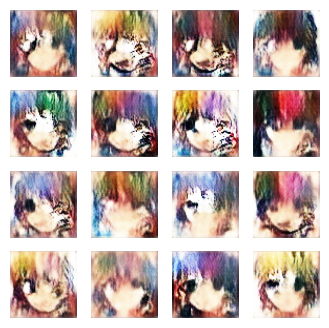

249/249 [==============================] - 85s 342ms/step - d_loss: -119.0839 - g_loss: -878.8425
Epoch 21/50
249/249 [==============================] - ETA: 0s - d_loss: -122.5353 - g_loss: -932.5605

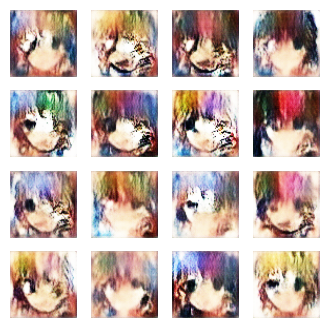

249/249 [==============================] - 86s 344ms/step - d_loss: -122.5353 - g_loss: -932.5605
Epoch 22/50
249/249 [==============================] - ETA: 0s - d_loss: -117.7992 - g_loss: -901.4556

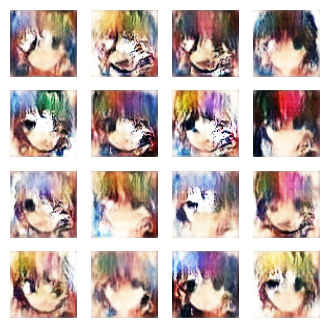

249/249 [==============================] - 86s 342ms/step - d_loss: -117.7992 - g_loss: -901.4556
Epoch 23/50
249/249 [==============================] - ETA: 0s - d_loss: -119.1623 - g_loss: -1248.1373

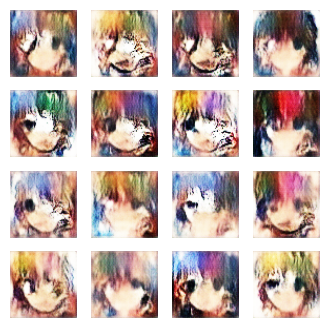

249/249 [==============================] - 85s 342ms/step - d_loss: -119.1623 - g_loss: -1248.1373
Epoch 24/50
249/249 [==============================] - ETA: 0s - d_loss: -118.5864 - g_loss: -736.7338

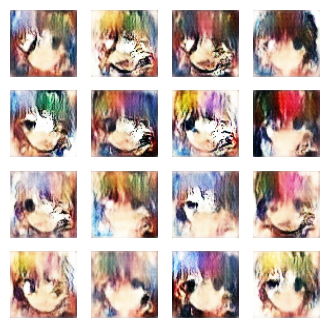

249/249 [==============================] - 86s 342ms/step - d_loss: -118.5864 - g_loss: -736.7338
Epoch 25/50
249/249 [==============================] - ETA: 0s - d_loss: -117.1957 - g_loss: -821.7269

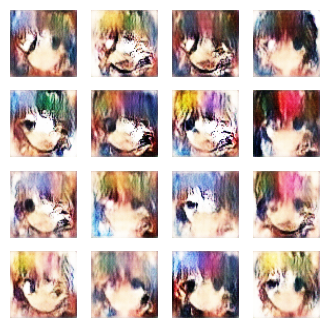

249/249 [==============================] - 86s 344ms/step - d_loss: -117.1957 - g_loss: -821.7269
Epoch 26/50
249/249 [==============================] - ETA: 0s - d_loss: -115.9755 - g_loss: -768.7482

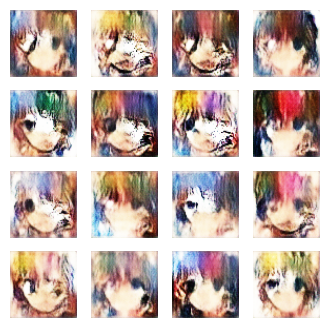

249/249 [==============================] - 85s 342ms/step - d_loss: -115.9755 - g_loss: -768.7482
Epoch 27/50
249/249 [==============================] - ETA: 0s - d_loss: -112.9645 - g_loss: -1065.8213

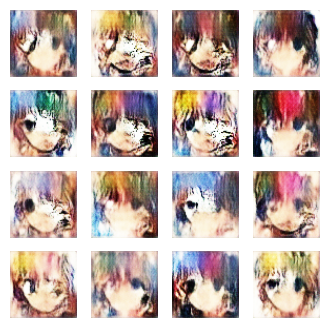

249/249 [==============================] - 86s 342ms/step - d_loss: -112.9645 - g_loss: -1065.8213
Epoch 28/50
249/249 [==============================] - ETA: 0s - d_loss: -103.9546 - g_loss: -1213.4601

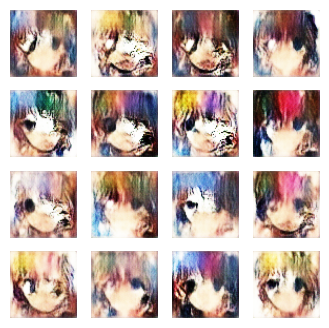

249/249 [==============================] - 86s 344ms/step - d_loss: -103.9546 - g_loss: -1213.4601
Epoch 29/50
249/249 [==============================] - ETA: 0s - d_loss: -112.4464 - g_loss: -1272.7974

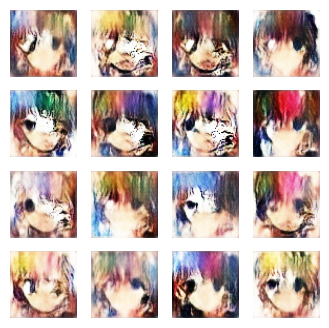

249/249 [==============================] - 86s 342ms/step - d_loss: -112.4464 - g_loss: -1272.7974
Epoch 30/50
249/249 [==============================] - ETA: 0s - d_loss: -103.2436 - g_loss: -944.8813

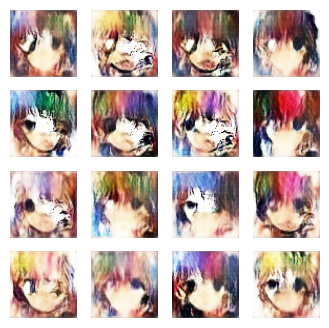

249/249 [==============================] - 86s 342ms/step - d_loss: -103.2436 - g_loss: -944.8813
Epoch 31/50
249/249 [==============================] - ETA: 0s - d_loss: -104.6673 - g_loss: -1031.1327

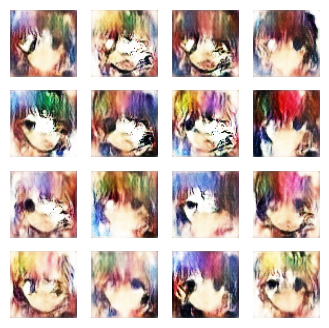

249/249 [==============================] - 86s 342ms/step - d_loss: -104.6673 - g_loss: -1031.1327
Epoch 32/50
249/249 [==============================] - ETA: 0s - d_loss: -102.3545 - g_loss: -867.0759

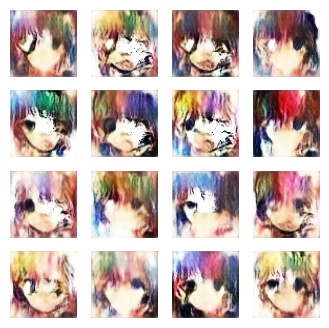

249/249 [==============================] - 86s 343ms/step - d_loss: -102.3545 - g_loss: -867.0759
Epoch 33/50
249/249 [==============================] - ETA: 0s - d_loss: -100.8855 - g_loss: -360.5329

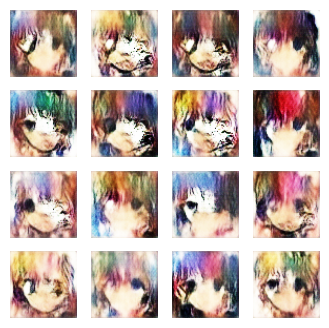

249/249 [==============================] - 86s 343ms/step - d_loss: -100.8855 - g_loss: -360.5329
Epoch 34/50
249/249 [==============================] - ETA: 0s - d_loss: -99.4037 - g_loss: -698.3724

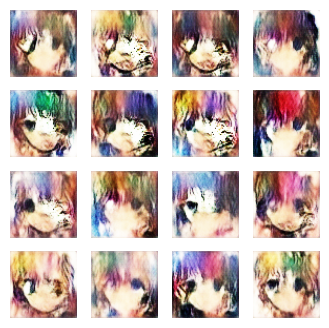

249/249 [==============================] - 85s 342ms/step - d_loss: -99.4037 - g_loss: -698.3724
Epoch 35/50
249/249 [==============================] - ETA: 0s - d_loss: -99.8764 - g_loss: -1180.3223

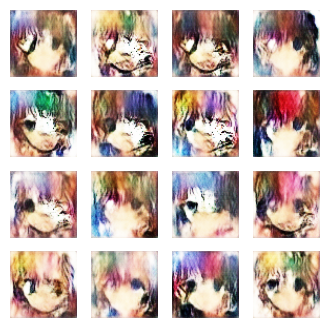

249/249 [==============================] - 86s 343ms/step - d_loss: -99.8764 - g_loss: -1180.3223
Epoch 36/50
249/249 [==============================] - ETA: 0s - d_loss: -98.6388 - g_loss: -1141.7169

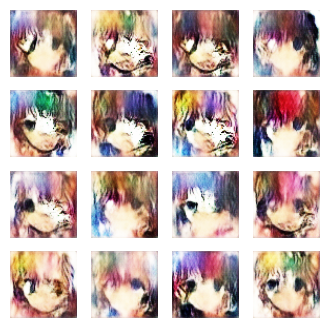

249/249 [==============================] - 86s 343ms/step - d_loss: -98.6388 - g_loss: -1141.7169
Epoch 37/50
249/249 [==============================] - ETA: 0s - d_loss: -97.7158 - g_loss: -813.9400

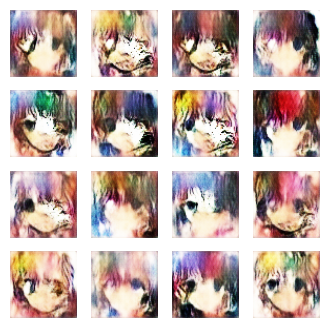

249/249 [==============================] - 85s 341ms/step - d_loss: -97.7158 - g_loss: -813.9400
Epoch 38/50
249/249 [==============================] - ETA: 0s - d_loss: -90.9673 - g_loss: -938.8962

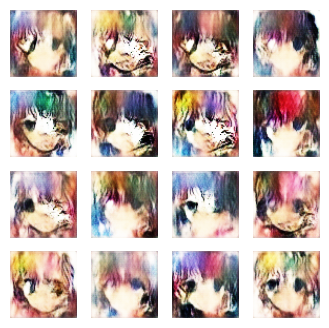

249/249 [==============================] - 85s 342ms/step - d_loss: -90.9673 - g_loss: -938.8962
Epoch 39/50
249/249 [==============================] - ETA: 0s - d_loss: -87.3397 - g_loss: -961.8846

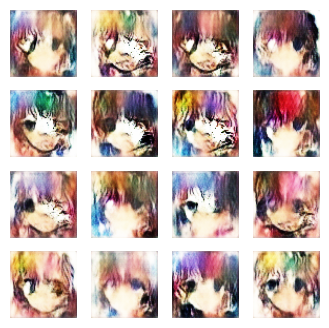

249/249 [==============================] - 86s 343ms/step - d_loss: -87.3397 - g_loss: -961.8846
Epoch 40/50
249/249 [==============================] - ETA: 0s - d_loss: -89.3867 - g_loss: -589.5153

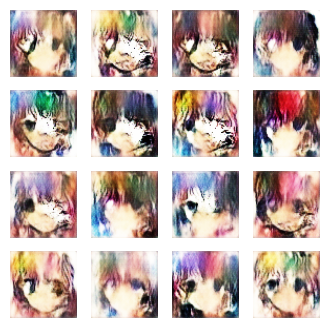

249/249 [==============================] - 86s 343ms/step - d_loss: -89.3867 - g_loss: -589.5153
Epoch 41/50
249/249 [==============================] - ETA: 0s - d_loss: -90.4335 - g_loss: -1131.4268

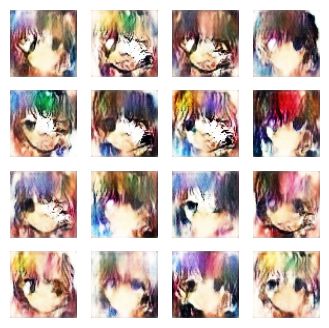

249/249 [==============================] - 85s 341ms/step - d_loss: -90.4335 - g_loss: -1131.4268
Epoch 42/50
249/249 [==============================] - ETA: 0s - d_loss: -90.0511 - g_loss: -1068.9673

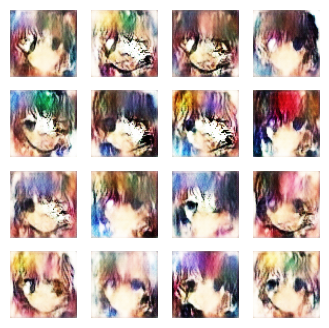

249/249 [==============================] - 86s 343ms/step - d_loss: -90.0511 - g_loss: -1068.9673
Epoch 43/50
249/249 [==============================] - ETA: 0s - d_loss: -86.6255 - g_loss: -856.8124

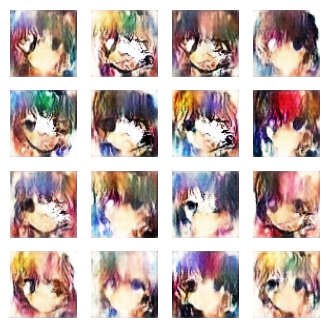

249/249 [==============================] - 86s 343ms/step - d_loss: -86.6255 - g_loss: -856.8124
Epoch 44/50
249/249 [==============================] - ETA: 0s - d_loss: -73.3555 - g_loss: -1030.1799

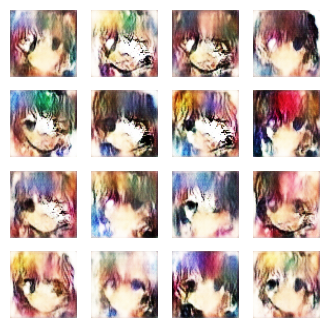

249/249 [==============================] - 86s 343ms/step - d_loss: -73.3555 - g_loss: -1030.1799
Epoch 45/50
249/249 [==============================] - ETA: 0s - d_loss: -76.8575 - g_loss: -1462.5969

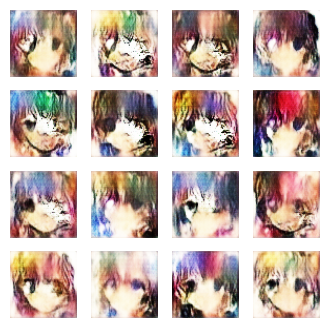

249/249 [==============================] - 86s 343ms/step - d_loss: -76.8575 - g_loss: -1462.5969
Epoch 46/50
249/249 [==============================] - ETA: 0s - d_loss: -72.5522 - g_loss: -1286.6520

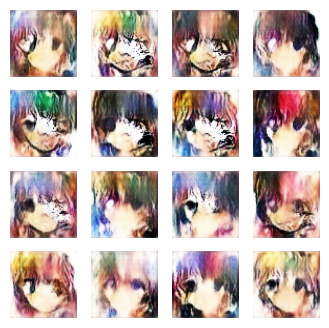

249/249 [==============================] - 85s 342ms/step - d_loss: -72.5522 - g_loss: -1286.6520
Epoch 47/50
249/249 [==============================] - ETA: 0s - d_loss: -72.5191 - g_loss: -1343.0583

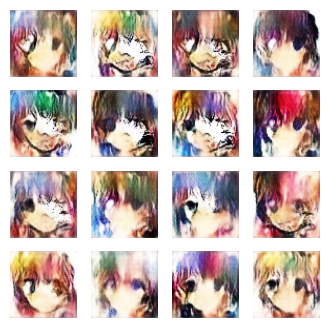

249/249 [==============================] - 85s 342ms/step - d_loss: -72.5191 - g_loss: -1343.0583
Epoch 48/50
249/249 [==============================] - ETA: 0s - d_loss: -71.9826 - g_loss: -1999.6440

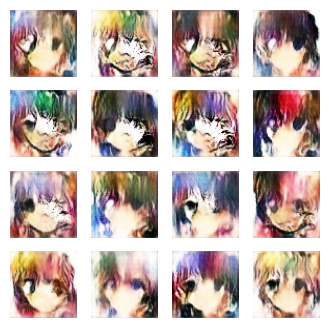

249/249 [==============================] - 86s 343ms/step - d_loss: -71.9826 - g_loss: -1999.6440
Epoch 49/50
249/249 [==============================] - ETA: 0s - d_loss: -74.9007 - g_loss: -1577.3918

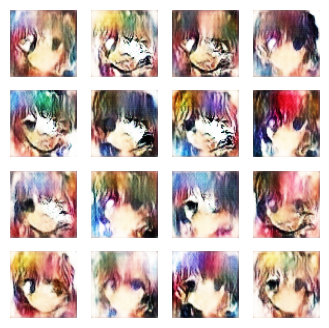

249/249 [==============================] - 85s 342ms/step - d_loss: -74.9007 - g_loss: -1577.3918
Epoch 50/50
249/249 [==============================] - ETA: 0s - d_loss: -73.5636 - g_loss: -1234.5568

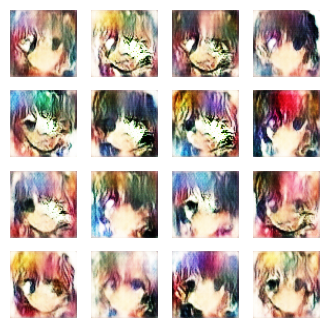

In [ ]:
NUM_EPOCHS = 50 # number of epochs
wgan.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])

In [ ]:
from google.colab import runtime
runtime.unassign()